# Dataset
[Dataset](https://www.kaggle.com/datasets/roboticbuilders/soiled-solar-panel-data)

In [1]:
import numpy as np
import pandas as pd

import spice_net as spn

In [2]:
df = pd.read_csv('data/solar_pannel_data.csv')
df = df[(df['Luminosity (Lux)'] <= 500)]
max_lux = df['Luminosity (Lux)'].max()
df['cleaned_lux'] = df['Luminosity (Lux)'].apply(lambda x: x / max_lux)
max_volts = df['Voltage (Volts)'].max()
df['cleaned_voltage'] = df['Voltage (Volts)'].apply(lambda x: x / max_volts)
df = df[1000:]
df

,DateTime,Luminosity (Lux),Voltage (Volts),Temprature (C),Dirty,cleaned_lux,cleaned_voltage
1743,2023-04-17 13:04:15,402.0,13.48,23.25,False,0.804,0.737015
1744,2023-04-17 13:04:23,402.0,13.48,23.25,False,0.804,0.737015
1745,2023-04-17 13:04:32,405.0,13.50,23.25,False,0.810,0.738108
1746,2023-04-17 13:04:40,406.0,13.53,23.25,False,0.812,0.739748
1747,2023-04-17 13:04:48,406.0,13.53,23.25,False,0.812,0.739748
...,...,...,...,...,...,...,...
4073,2023-04-29 10:43:05,13.0,2.12,19.00,False,0.026,0.115910
4074,2023-04-29 10:50:00,10.0,2.00,19.00,False,0.020,0.109349
4075,2023-04-29 10:57:10,10.0,1.49,18.50,False,0.020,0.081465
4076,2023-04-29 11:04:20,11.0,1.71,18.25,False,0.022,0.093494


In [3]:
som_size = 100

som_1 = spn.SpiceNetSom(n_neurons=som_size,
                        value_range_start=df['cleaned_lux'].min(),
                        value_range_end=df['cleaned_lux'].max(),
                        lrf_tuning_curve=spn.ConstLRF(0.8),
                        lrf_interaction_kernel=spn.ConstLRF(0.8))
som_2 = spn.SpiceNetSom(n_neurons=som_size,
                        value_range_start=df['cleaned_voltage'].min(),
                        value_range_end=df['cleaned_voltage'].max(),
                        lrf_tuning_curve=spn.ConstLRF(0.8),
                        lrf_interaction_kernel=spn.ConstLRF(0.8))

correlation_matrix = spn.SpiceNetHcm(som_1=som_1,
                                     som_2=som_2,
                                     lrf_weights=spn.ConstLRF(0.5),  # spn.ExpEDecayLRF(0.003, 0.3, 0.6)
                                     lrf_trust_of_new=spn.ExpEDecayLRF(0.3, 0.25, 0.3))

spice_net = spn.SpiceNet(correlation_matrix)

In [4]:
config_1 = {'sample_set_size': 1000, 'epochs_on_batch': 100, 'batch_size': 40, 'train_set': 0.2}
config_2 = {'sample_set_size': 1300, 'epochs_on_batch': 50, 'batch_size': 100, 'train_set': 0.61}

config = config_2
sample_set_size = config['sample_set_size']
sub_set = df.sample(n=sample_set_size)
train_set = sub_set[:int(sample_set_size * config['train_set'])]
test_set = sub_set[int(sample_set_size * config['train_set']):]

In [5]:
spice_net.fit(train_set['cleaned_lux'].tolist(), train_set['cleaned_voltage'].tolist(),
              epochs_on_batch=config['epochs_on_batch'],
              batch_size=config['batch_size'],
              print_output=True)
spn.plot_som(som_1, True)
spn.plot_som(som_2, True)
spn.plot_hcm(correlation_matrix, False)
spn.plot_hcm(correlation_matrix, True)

100%|██████████| 8/8 [00:31<00:00,  3.88s/it]


Time spend on the Components: 
Som: 19.59268856048584 s | Convolution Matrix: 11.475823163986206 s


In [6]:
import plotly.express as px

test_set = df
test_set.sort_values(by=['DateTime'])

errors = []
errors_distance = []
predicted_values = []

for _, row in test_set.iterrows():
    inti_test_value = row['cleaned_lux']
    result_test_value = row['cleaned_voltage'] * max_volts
    predicted = spice_net.decode(inti_test_value) * max_volts
    predicted_values.append(predicted)
    errors.append(abs(predicted - result_test_value) / max_volts * 100)
    errors_distance.append(abs(predicted - result_test_value))
    print(
        f'Error: {errors[-1]:.6f},\t Distance: {errors_distance[-1]:.2f}, Predicted: {predicted:5.2f},\t Actual: {result_test_value:5.2f}')

print('------------------------------------')
print(f'test set length: {len(test_set)}')
print(f'Mean Error in V {np.mean(np.array(errors_distance))}')
print(f'Mean Error in % {np.mean(np.array(errors))}')
print(f'Median Error in % {np.median(np.array(errors))}')

direction = test_set['Voltage (Volts)'].to_numpy() - np.array(predicted_values)
error_df = pd.DataFrame(
    {'Index': range(1, len(errors) + 1),
     'Real': test_set['Voltage (Volts)'],
     'Distance': errors_distance,
     'dir': direction.tolist()})
fig = px.scatter(error_df, x="Index", y="Real", error_y="Distance")
fig.add_scatter(x=error_df['Index'].to_numpy(), y=predicted_values, fillcolor='orange', mode='markers', name='Predicted', zorder=1000)
#fig.add_scatter(x=error_df['Index'].to_numpy(), y=error_df['Real'].to_numpy(), fillcolor='green')
fig.show()

Error: 0.749499,	 Distance: 0.14, Predicted: 13.62,	 Actual: 13.48
Error: 0.749499,	 Distance: 0.14, Predicted: 13.62,	 Actual: 13.48
Error: 0.661345,	 Distance: 0.12, Predicted: 13.62,	 Actual: 13.50
Error: 0.495696,	 Distance: 0.09, Predicted: 13.62,	 Actual: 13.53
Error: 0.495696,	 Distance: 0.09, Predicted: 13.62,	 Actual: 13.53
Error: 0.364794,	 Distance: 0.07, Predicted: 13.62,	 Actual: 13.55
Error: 0.264014,	 Distance: 0.05, Predicted: 13.62,	 Actual: 13.57
Error: 0.255445,	 Distance: 0.05, Predicted: 13.62,	 Actual: 13.57
Error: 0.083895,	 Distance: 0.02, Predicted: 13.62,	 Actual: 13.60
Error: 0.099989,	 Distance: 0.02, Predicted: 13.62,	 Actual: 13.60
Error: 0.114598,	 Distance: 0.02, Predicted: 13.62,	 Actual: 13.60
Error: 0.059845,	 Distance: 0.01, Predicted: 13.61,	 Actual: 13.60
Error: 0.003188,	 Distance: 0.00, Predicted: 13.60,	 Actual: 13.60
Error: 0.242481,	 Distance: 0.04, Predicted: 13.59,	 Actual: 13.55
Error: 1.469646,	 Distance: 0.27, Predicted: 13.82,	 Actual: 1

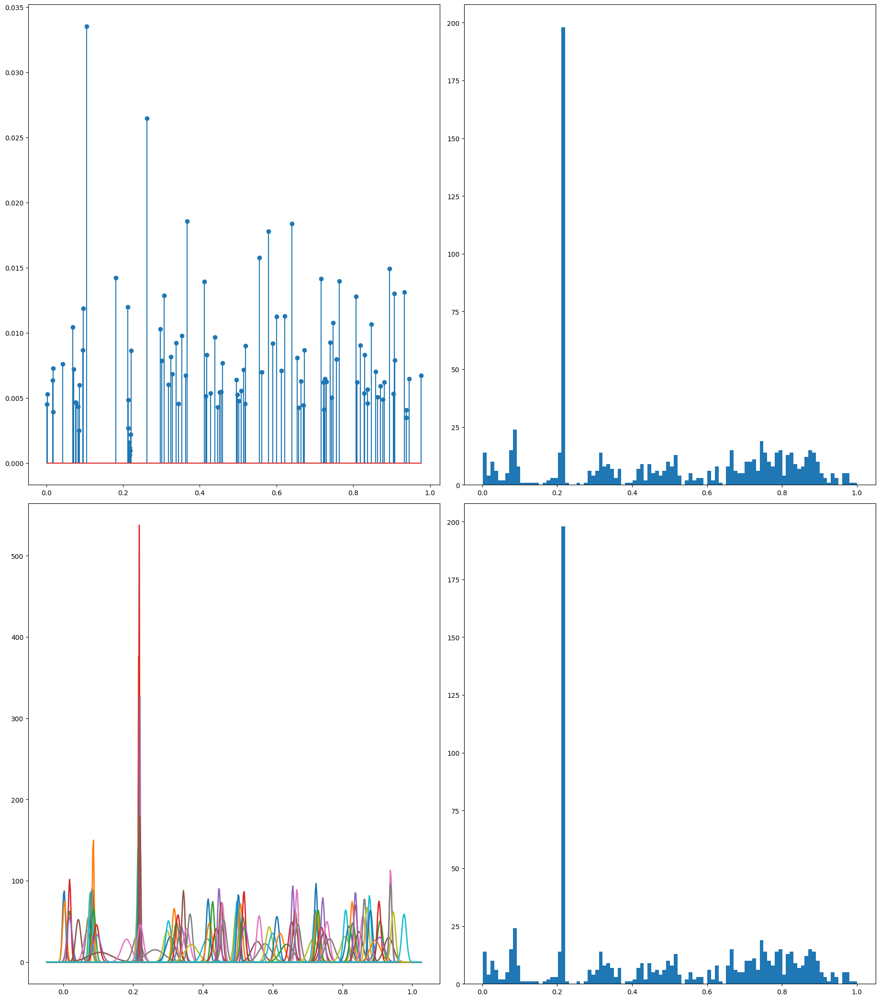

In [7]:
spn.plot_som_comparison_to_data(som_1, train_set['cleaned_lux'].tolist())